In [1]:
#ngboost and modelling libraries
from ngboost import NGBClassifier
from ngboost.distns import Bernoulli
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from collections import Counter

#data manipulation libraries
import pandas as pd
import numpy as np

from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#import functions and constants
from utils import (register_imputation, preprocess_df, 
                    scaling_values_df, clean_outliers, get_sample_weights, 
                  process_unit_cost, cost_score, generate_y_pred_with_custom_threshold, 
                  calculate_cost_score_with_learning, calculate_learning_cost, process_learning_unit_cost, check_counts,)
from plot_utils import (correlation_heatmap, visualize_permutation_feature_importances, 
                        plot_target_balance, plot_trace_line, plot_scatter_matrix, 
                        plot_feature_importances, visualize_roc_curve, color_negative_red, )

from constants import cols, cols_with_missing_indicators

In [2]:
SEED = 2020

In [3]:
df = pd.read_csv("./data/cs-training.csv", usecols =cols)

In [4]:
from sklearn.model_selection import train_test_split

df, df_test = train_test_split(df, test_size=0.2,random_state=42)

In [5]:

def preprocess_extra(df):
    """
    Extra cleanup process of some outliers.
    """
    df.loc[
        (df["RevolvingUtilizationOfUnsecuredLines"] > 1),
        "RevolvingUtilizationOfUnsecuredLines",
    ] = 0
    df.loc[(df["DebtRatio"] > 10), "DebtRatio"] = 0
    df.loc[(df["age"] < 18), "age"] = 0

In [6]:
from sklearn.neighbors import LocalOutlierFactor
def clean_outliers(df, flag_filter=False):
    """ 
    Register imputations, identify outliers with LOF and clean them. Also it process an extra function to clean some outliers.

    Args:
        - df (DataFrame Object): dataframe to be processed
        - flag_filter (boolean): Flag that indicates if the process requres an extra cleanup of outliers.

    Returns dataframe without outliers
    """
    #df = preprocess_df(df.copy())
    df = register_imputation(df.copy())
    local_outlier_factor = LocalOutlierFactor(contamination=0.1)
    is_outlier = local_outlier_factor.fit_predict(df[cols[1:]]) == -1
    data_outlier_excluded = df.loc[~is_outlier, :]
    if flag_filter:
        preprocess_extra(data_outlier_excluded)
    return data_outlier_excluded

In [7]:
df = clean_outliers(df.copy(), True)

In [8]:
cols_f = [c for c in df.columns if 'dummy' not in c.lower()]

df_cleaned=df.copy()[cols_f].reset_index(drop=True)

In [9]:
del df
df = df_cleaned.copy()
df

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,0,0.000000,29,0,0.011513,4342.0,5,0,0,0,0.0
1,0,0.595526,55,0,0.835333,1833.0,11,0,1,0,0.0
2,0,0.000000,43,0,0.043437,4166.0,2,0,0,0,4.0
3,0,0.000000,35,0,0.133598,5800.0,12,0,1,0,0.0
4,0,0.442956,61,0,0.658520,7200.0,12,0,2,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
107995,0,0.107445,72,0,0.899275,4000.0,17,0,2,0,1.0
107996,0,0.087697,67,1,0.000000,0.0,10,0,1,0,1.0
107997,0,0.068788,49,0,0.673331,2800.0,8,0,2,0,0.0
107998,0,0.219630,36,0,0.025316,1500.0,2,0,0,0,0.0


In [10]:
import random
random.seed(2019)
list_of_ids_train=random.sample(range(0,len(df)), int(len(df) * 0.2))

In [11]:
df['NumberRealEstateLoansOrLines'] = df['NumberRealEstateLoansOrLines'].astype(float)
df['NumberOfOpenCreditLinesAndLoans'] = df['NumberOfOpenCreditLinesAndLoans'].astype(float)

In [12]:
for idx in list_of_ids_train:
    for col in ['MonthlyIncome', 'NumberRealEstateLoansOrLines', 'NumberOfOpenCreditLinesAndLoans']: #en el segundo lugar estaba dummy_MonthlyIncome
        df.at[idx, col] = np.nan

In [13]:
def register_imputation(df):
    """
    Register imputations of certain df
    Args:
        - df (DataFrame): Dataframe to be computed
    Return df with filled values and booleans that indicate if each row was changed
    """
    for c in cols[1:]:
        # df[f"{c}_amputado"] = df[f"{c}"].fillna(0)
        df[f"{c}_imputed"] = df[f"{c}"].fillna(0)
        df[f"dummy_{c}"] = (df[f"{c}"] != df[f"{c}_imputed"]).astype(int)
        del df[f"{c}"]
        df.columns = df.columns.str.replace(f"{c}_imputed", f"{c}")
    return df


In [14]:
df = register_imputation(df.copy())

In [15]:
X_train = df.drop(columns=['SeriousDlqin2yrs']).values
y_train = df.SeriousDlqin2yrs.values

In [16]:
df_test = register_imputation(df_test.copy())
X_test = df_test.drop(columns=['SeriousDlqin2yrs']).values
y_test = df_test.SeriousDlqin2yrs.values

In [17]:
nm_common =SMOTE(random_state=2019)
X_train_resampled, y_train_resampled = nm_common.fit_sample(X_train, y_train)
print("Resampled dataset shape {}".format(Counter(y_train_resampled)))

Resampled dataset shape Counter({0: 101298, 1: 101298})


In [19]:
#base0 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=4)
from utils import check_counts
base1 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=4, random_state = SEED)
base2 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=8, random_state = SEED)
base3 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=10, random_state = SEED)
base4 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=12, random_state = SEED)

In [23]:
#FIX MEEEEEEEEEEE: REFACTOR PLZZ !!! second model learning_cost
df_collector = pd.DataFrame(columns=  ["alpha","hyperparams", "estimators", 
                                       "learning_rate", "max_depth", "threshold", "count_zero", "count_one",
                                       "cost", 
                                       "learning_cost",
                                       "train_auc", "test_auc"])
df_collector['hyperparams'] = df_collector['hyperparams'].astype('object')
k = 0
for estimator in [150, 200, 250,300,350]:
    for lr in [0.01]:
        for baset in [base1,base2,base3,base4]:
            ngb_clf = NGBClassifier(Dist=Bernoulli,
                                      verbose=True, Base=baset, n_estimators = estimator, random_state=SEED,
                                    learning_rate = lr, verbose_eval = 0
                                     )
            print(ngb_clf)
            ngb_clf.fit(X_train_resampled, y_train_resampled, sample_weight= get_sample_weights(y_train, y_train_resampled))
            #en el primer iteraba el threashold desde 0.1 a 0.9 obviamente cuanto mas menor me daba peor.. entonces itero
            #solamente d esde 0.70 a 0.95
            for threshold in list(np.arange(0.25, 0.5, 0.05)):
                count_zero, count_one = check_counts(ngb_clf, X_test, threshold)
                if (count_zero < 7000):
                    pass
                else:
                    for kix in range(0,25):
                        alpha = random.randint(150, 500)
                        df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
                        df_aux['predicted'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, threshold)
                        df_aux['proba_predicted'] = [proba[1] for proba in ngb_clf.predict_proba(X_test)]
                        df_aux['real'] = list(y_test)
                        df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2
                        cost = cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)
                        learning_cost = calculate_learning_cost(df_aux.predicted,df_aux.proba_predicted, alpha)
                        if cost-learning_cost  > 700000:
                            #alpha = random.randint(10000, 700000)
                            df_collector.ix[str(k),'alpha'] = alpha
                            df_collector.ix[str(k),'hyperparams'] = ngb_clf
                            df_collector.ix[str(k),'estimators'] = estimator
                            df_collector.ix[str(k),'learning_rate'] = lr
                            df_collector.ix[str(k),'max_depth'] = baset.max_depth
                            threshold = round(threshold,2)
                            print("k: "+str(k))
                            print(threshold)
                            print("cost "+str(cost))
                            print("cost "+str(learning_cost))
                            print("th "+str(threshold))
                            df_collector.ix[str(k),'threshold'] = threshold
                            count_zero, count_one = check_counts(ngb_clf, X_test, threshold)
                            df_collector.ix[str(k),'count_zero'] = count_zero
                            df_collector.ix[str(k),'count_one'] = count_one
                            df_collector.ix[str(k),'cost'] = cost
                            df_collector.ix[str(k),'learning_cost'] = learning_cost
                            # predict probabilities
                            train_probs = ngb_clf.predict_proba(X_train)
                            test_probs = ngb_clf.predict_proba(X_test)
                            # keep probabilities for the positive outcome only
                            train_probs = train_probs[:, 1]
                            test_probs = test_probs[:, 1]
                            # calculate scores
                            train_auc = roc_auc_score(y_train, train_probs)
                            test_auc = roc_auc_score(y_test, test_probs)
                            df_collector.ix[str(k),'train_auc'] = train_auc
                            df_collector.ix[str(k),'test_auc'] = test_auc
                            k+=1
                            print("sumando k")
                            print("---------------------------------")
            del ngb_clf
df_collector['final_cost'] = df_collector['cost'] + df_collector['learning_cost']
df_collector['diff_auc'] = df_collector['train_auc'] - df_collector['test_auc']

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=4,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

count_zero 9849
count_one 20151
k: 43
0.35
cost 2622773.059999996
cost 326026.05515146645
th 0.35
sumando k
---------------------------------
count_zero 9849
count_one 20151
k: 44
0.35
cost 2622773.059999996
cost 291470.2981538483
th 0.35
sumando k
---------------------------------
count_zero 9849
count_one 20151
k: 45
0.35
cost 2622773.059999996
cost 238885.45054877305
th 0.35
sumando k
---------------------------------
count_zero 9849
count_one 20151
k: 46
0.35
cost 2622773.059999996
cost 591955.1416114252
th 0.35
sumando k
---------------------------------
count_zero 9849
count_one 20151
k: 47
0.35
cost 2622773.059999996
cost 276446.0559809697
th 0.35
sumando k
---------------------------------
count_zero 9849
count_one 20151
k: 48
0.35
cost 2622773.059999996
cost 261421.81380809177
th 0.35
sumando k
---------------------------------
count_zero 9849
count_one 20151
k: 49
0.35
cost 2622773.059999996
cost 318513.9340650313
th 0.35
sumando k
---------------------------------
count_zero

count_zero 9680
count_one 20320
k: 100
0.25
cost 3278370.479999996
cost 308538.3870075267
th 0.25
sumando k
---------------------------------
count_zero 9680
count_one 20320
k: 101
0.25
cost 3278370.479999996
cost 442040.5736934717
th 0.25
sumando k
---------------------------------
count_zero 9680
count_one 20320
k: 102
0.25
cost 3278370.479999996
cost 446985.0991262857
th 0.25
sumando k
---------------------------------
count_zero 9680
count_one 20320
k: 103
0.25
cost 3278370.479999996
cost 171080.5799753277
th 0.25
sumando k
---------------------------------
count_zero 9680
count_one 20320
k: 104
0.25
cost 3278370.479999996
cost 345127.87521033944
th 0.25
sumando k
---------------------------------
count_zero 9680
count_one 20320
k: 105
0.25
cost 3278370.479999996
cost 212614.5936109549
th 0.25
sumando k
---------------------------------
count_zero 9680
count_one 20320
k: 106
0.25
cost 3278370.479999996
cost 299638.24122846214
th 0.25
sumando k
---------------------------------
coun

sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 158
0.35
cost 3500615.1799999867
cost 447098.1417642741
th 0.35
sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 159
0.35
cost 3500615.1799999867
cost 295315.746774186
th 0.35
sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 160
0.35
cost 3500615.1799999867
cost 557635.3207244485
th 0.35
sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 161
0.35
cost 3500615.1799999867
cost 772110.4440800027
th 0.35
sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 162
0.35
cost 3500615.1799999867
cost 298615.36405658093
th 0.35
sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 163
0.35
cost 3500615.1799999867
cost 757262.16630923
th 0.35
sumando k
---------------------------------
count_zero 12855
count_one 17145
k: 164
0.35
cost 3500615.1799999867
cost 717666.7589205083
th

k: 215
0.45
cost 3887154.619999988
cost 387925.81226408493
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 14149
k: 216
0.45
cost 3887154.619999988
cost 487272.66662440076
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 14149
k: 217
0.45
cost 3887154.619999988
cost 600811.9287504704
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 14149
k: 218
0.45
cost 3887154.619999988
cost 839717.4594740852
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 14149
k: 219
0.45
cost 3887154.619999988
cost 482541.8640358154
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 14149
k: 220
0.45
cost 3887154.619999988
cost 856275.2685341449
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 14149
k: 221
0.45
cost 3887154.619999988
cost 759293.815468119
th 0.45
sumando k
---------------------------------
count_zero 15851
count_one 1414

k: 265
0.3
cost 4724782.700000014
cost 455559.8265502243
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 266
0.3
cost 4724782.700000014
cost 209199.67865750557
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 267
0.3
cost 4724782.700000014
cost 221586.50173590874
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 268
0.3
cost 4724782.700000014
cost 615212.2128941155
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 269
0.3
cost 4724782.700000014
cost 462441.3949271148
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 270
0.3
cost 4724782.700000014
cost 553278.097502082
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 271
0.3
cost 4724782.700000014
cost 473451.90433014114
th 0.3
sumando k
---------------------------------
count_zero 15958
count_one 14042
k: 272
0.3


count_zero 18635
count_one 11365
k: 323
0.4
cost 5749242.2200000435
cost 701566.7432593164
th 0.4
sumando k
---------------------------------
count_zero 18635
count_one 11365
k: 324
0.4
cost 5749242.2200000435
cost 471674.8160895977
th 0.4
sumando k
---------------------------------
count_zero 19902
count_one 10098
k: 325
0.45
cost 6354745.36000004
cost 389507.1781858921
th 0.45
sumando k
---------------------------------
count_zero 19902
count_one 10098
k: 326
0.45
cost 6354745.36000004
cost 1086037.661530063
th 0.45
sumando k
---------------------------------
count_zero 19902
count_one 10098
k: 327
0.45
cost 6354745.36000004
cost 957729.4145982421
th 0.45
sumando k
---------------------------------
count_zero 19902
count_one 10098
k: 328
0.45
cost 6354745.36000004
cost 417001.8025284227
th 0.45
sumando k
---------------------------------
count_zero 19902
count_one 10098
k: 329
0.45
cost 6354745.36000004
cost 721733.8889915041
th 0.45
sumando k
---------------------------------
count_

sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 366
0.25
cost 2520690.939999991
cost 441306.71939858166
th 0.25
sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 367
0.25
cost 2520690.939999991
cost 213857.05498576065
th 0.25
sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 368
0.25
cost 2520690.939999991
cost 210232.35913854386
th 0.25
sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 369
0.25
cost 2520690.939999991
cost 389654.8035757498
th 0.25
sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 370
0.25
cost 2520690.939999991
cost 229262.01233642944
th 0.25
sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 371
0.25
cost 2520690.939999991
cost 245573.14364890268
th 0.25
sumando k
---------------------------------
count_zero 7561
count_one 22439
k: 372
0.25
cost 2520690.939999991
cost 212044.7070621512
th 0.25
s

sumando k
---------------------------------
count_zero 10508
count_one 19492
k: 424
0.35
cost 2691299.639999993
cost 382961.29365365114
th 0.35
sumando k
---------------------------------
count_zero 11848
count_one 18152
k: 425
0.4
cost 2883965.3799999943
cost 887349.8994485765
th 0.4
sumando k
---------------------------------
count_zero 11848
count_one 18152
k: 426
0.4
cost 2883965.3799999943
cost 436341.4794809104
th 0.4
sumando k
---------------------------------
count_zero 11848
count_one 18152
k: 427
0.4
cost 2883965.3799999943
cost 544510.1655707171
th 0.4
sumando k
---------------------------------
count_zero 11848
count_one 18152
k: 428
0.4
cost 2883965.3799999943
cost 375840.3499730546
th 0.4
sumando k
---------------------------------
count_zero 11848
count_one 18152
k: 429
0.4
cost 2883965.3799999943
cost 434508.111920067
th 0.4
sumando k
---------------------------------
count_zero 11848
count_one 18152
k: 430
0.4
cost 2883965.3799999943
cost 280505.2368091586
th 0.4
suman

count_zero 10254
count_one 19746
k: 475
0.25
cost 3213808.199999995
cost 329841.49072897516
th 0.25
sumando k
---------------------------------
count_zero 10254
count_one 19746
k: 476
0.25
cost 3213808.199999995
cost 435274.69451037794
th 0.25
sumando k
---------------------------------
count_zero 10254
count_one 19746
k: 477
0.25
cost 3213808.199999995
cost 250524.76861819447
th 0.25
sumando k
---------------------------------
count_zero 10254
count_one 19746
k: 478
0.25
cost 3213808.199999995
cost 471063.9471701201
th 0.25
sumando k
---------------------------------
count_zero 10254
count_one 19746
k: 479
0.25
cost 3213808.199999995
cost 463325.7303788208
th 0.25
sumando k
---------------------------------
count_zero 10254
count_one 19746
k: 480
0.25
cost 3213808.199999995
cost 171208.04650741554
th 0.25
sumando k
---------------------------------
count_zero 10254
count_one 19746
k: 481
0.25
cost 3213808.199999995
cost 191520.86558456603
th 0.25
sumando k
----------------------------

sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 533
0.35
cost 3497667.0399999875
cost 613264.6979356856
th 0.35
sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 534
0.35
cost 3497667.0399999875
cost 523596.75254561607
th 0.35
sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 535
0.35
cost 3497667.0399999875
cost 467554.28667681635
th 0.35
sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 536
0.35
cost 3497667.0399999875
cost 320242.66210740834
th 0.35
sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 537
0.35
cost 3497667.0399999875
cost 352266.9283181501
th 0.35
sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 538
0.35
cost 3497667.0399999875
cost 425922.74060285336
th 0.35
sumando k
---------------------------------
count_zero 13293
count_one 16707
k: 539
0.35
cost 3497667.0399999875
cost 486768.8464032

k: 590
0.45
cost 3893526.6599999876
cost 1032643.2254919324
th 0.45
sumando k
---------------------------------
count_zero 16237
count_one 13763
k: 591
0.45
cost 3893526.6599999876
cost 792922.4767170206
th 0.45
sumando k
---------------------------------
count_zero 16237
count_one 13763
k: 592
0.45
cost 3893526.6599999876
cost 401071.25275802787
th 0.45
sumando k
---------------------------------
count_zero 16237
count_one 13763
k: 593
0.45
cost 3893526.6599999876
cost 774482.4191189482
th 0.45
sumando k
---------------------------------
count_zero 16237
count_one 13763
k: 594
0.45
cost 3893526.6599999876
cost 652317.0375317337
th 0.45
sumando k
---------------------------------
count_zero 16237
count_one 13763
k: 595
0.45
cost 3893526.6599999876
cost 1025728.2038926588
th 0.45
sumando k
---------------------------------
count_zero 16237
count_one 13763
k: 596
0.45
cost 3893526.6599999876
cost 656927.0519312497
th 0.45
sumando k
---------------------------------
count_zero 16237
count

count_zero 16555
count_one 13445
k: 640
0.3
cost 4957667.560000034
cost 259210.84162656663
th 0.3
sumando k
---------------------------------
count_zero 16555
count_one 13445
k: 641
0.3
cost 4957667.560000034
cost 383632.04560731666
th 0.3
sumando k
---------------------------------
count_zero 16555
count_one 13445
k: 642
0.3
cost 4957667.560000034
cost 370671.50352598785
th 0.3
sumando k
---------------------------------
count_zero 16555
count_one 13445
k: 643
0.3
cost 4957667.560000034
cost 379743.8829829176
th 0.3
sumando k
---------------------------------
count_zero 16555
count_one 13445
k: 644
0.3
cost 4957667.560000034
cost 366783.34090159164
th 0.3
sumando k
---------------------------------
count_zero 16555
count_one 13445
k: 645
0.3
cost 4957667.560000034
cost 221625.2695907145
th 0.3
sumando k
---------------------------------
count_zero 16555
count_one 13445
k: 646
0.3
cost 4957667.560000034
cost 287724.0342054894
th 0.3
sumando k
---------------------------------
count_zer

sumando k
---------------------------------
count_zero 19046
count_one 10954
k: 698
0.4
cost 5939703.640000046
cost 773603.5521688476
th 0.4
sumando k
---------------------------------
count_zero 19046
count_one 10954
k: 699
0.4
cost 5939703.640000046
cost 533712.0660395686
th 0.4
sumando k
---------------------------------
count_zero 20240
count_one 9760
k: 700
0.45
cost 6599488.720000046
cost 477577.2150401278
th 0.45
sumando k
---------------------------------
count_zero 20240
count_one 9760
k: 701
0.45
cost 6599488.720000046
cost 621710.8790387281
th 0.45
sumando k
---------------------------------
count_zero 20240
count_one 9760
k: 702
0.45
cost 6599488.720000046
cost 983120.6633934194
th 0.45
sumando k
---------------------------------
count_zero 20240
count_one 9760
k: 703
0.45
cost 6599488.720000046
cost 449610.9817269702
th 0.45
sumando k
---------------------------------
count_zero 20240
count_one 9760
k: 704
0.45
cost 6599488.720000046
cost 372166.0279366776
th 0.45
sumando 

k: 740
0.25
cost 2581714.879999994
cost 179597.80428056058
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k: 741
0.25
cost 2581714.879999994
cost 225413.57067866225
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k: 742
0.25
cost 2581714.879999994
cost 344534.5633137272
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k: 743
0.25
cost 2581714.879999994
cost 179597.80428056058
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k: 744
0.25
cost 2581714.879999994
cost 452659.77201324946
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k: 745
0.25
cost 2581714.879999994
cost 148443.0831298511
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k: 746
0.25
cost 2581714.879999994
cost 260233.5531412191
th 0.25
sumando k
---------------------------------
count_zero 7923
count_one 22077
k:

count_zero 10903
count_one 19097
k: 798
0.35
cost 2760031.779999997
cost 563786.300774461
th 0.35
sumando k
---------------------------------
count_zero 10903
count_one 19097
k: 799
0.35
cost 2760031.779999997
cost 497729.5952341302
th 0.35
sumando k
---------------------------------
count_zero 12218
count_one 17782
k: 800
0.4
cost 2941618.3599999934
cost 311625.49893850676
th 0.4
sumando k
---------------------------------
count_zero 12218
count_one 17782
k: 801
0.4
cost 2941618.3599999934
cost 846367.4793655244
th 0.4
sumando k
---------------------------------
count_zero 12218
count_one 17782
k: 802
0.4
cost 2941618.3599999934
cost 691476.6988280475
th 0.4
sumando k
---------------------------------
count_zero 12218
count_one 17782
k: 803
0.4
cost 2941618.3599999934
cost 414886.01929682866
th 0.4
sumando k
---------------------------------
count_zero 12218
count_one 17782
k: 804
0.4
cost 2941618.3599999934
cost 872182.6094551114
th 0.4
sumando k
---------------------------------
cou

count_zero 10536
count_one 19464
k: 850
0.25
cost 3253725.939999992
cost 360522.42246194405
th 0.25
sumando k
---------------------------------
count_zero 10536
count_one 19464
k: 851
0.25
cost 3253725.939999992
cost 297740.15364271373
th 0.25
sumando k
---------------------------------
count_zero 10536
count_one 19464
k: 852
0.25
cost 3253725.939999992
cost 266349.01923309866
th 0.25
sumando k
---------------------------------
count_zero 10536
count_one 19464
k: 853
0.25
cost 3253725.939999992
cost 356717.4364729002
th 0.25
sumando k
---------------------------------
count_zero 10536
count_one 19464
k: 854
0.25
cost 3253725.939999992
cost 353863.6969811166
th 0.25
sumando k
---------------------------------
count_zero 10536
count_one 19464
k: 855
0.25
cost 3253725.939999992
cost 457549.5651825739
th 0.25
sumando k
---------------------------------
count_zero 10536
count_one 19464
k: 856
0.25
cost 3253725.939999992
cost 256836.55426048828
th 0.25
sumando k
-----------------------------

sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 908
0.35
cost 3551953.4599999846
cost 471849.8497114979
th 0.35
sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 909
0.35
cost 3551953.4599999846
cost 716454.2868529098
th 0.35
sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 910
0.35
cost 3551953.4599999846
cost 456068.91828302154
th 0.35
sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 911
0.35
cost 3551953.4599999846
cost 424507.0554260611
th 0.35
sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 912
0.35
cost 3551953.4599999846
cost 503411.71256845666
th 0.35
sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 913
0.35
cost 3551953.4599999846
cost 628081.0708534296
th 0.35
sumando k
---------------------------------
count_zero 13540
count_one 16460
k: 914
0.35
cost 3551953.4599999846
cost 372429.981712085

k: 965
0.45
cost 3967458.799999989
cost 754316.19847337
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k: 966
0.45
cost 3967458.799999989
cost 699951.0670518675
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k: 967
0.45
cost 3967458.799999989
cost 631994.652774984
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k: 968
0.45
cost 3967458.799999989
cost 414534.1270889691
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k: 969
0.45
cost 3967458.799999989
cost 482490.54136585246
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k: 970
0.45
cost 3967458.799999989
cost 611607.7284919234
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k: 971
0.45
cost 3967458.799999989
cost 500612.2518396861
th 0.45
sumando k
---------------------------------
count_zero 16415
count_one 13585
k

count_zero 16833
count_one 13167
k: 1015
0.3
cost 5156233.920000043
cost 328659.1389351865
th 0.3
sumando k
---------------------------------
count_zero 16833
count_one 13167
k: 1016
0.3
cost 5156233.920000043
cost 199723.63058369057
th 0.3
sumando k
---------------------------------
count_zero 16833
count_one 13167
k: 1017
0.3
cost 5156233.920000043
cost 610547.5542526741
th 0.3
sumando k
---------------------------------
count_zero 16833
count_one 13167
k: 1018
0.3
cost 5156233.920000043
cost 198459.55697240177
th 0.3
sumando k
---------------------------------
count_zero 16833
count_one 13167
k: 1019
0.3
cost 5156233.920000043
cost 494252.78201406857
th 0.3
sumando k
---------------------------------
count_zero 16833
count_one 13167
k: 1020
0.3
cost 5156233.920000043
cost 213628.44030787188
th 0.3
sumando k
---------------------------------
count_zero 16833
count_one 13167
k: 1021
0.3
cost 5156233.920000043
cost 604227.186196228
th 0.3
sumando k
---------------------------------
cou

sumando k
---------------------------------
count_zero 19228
count_one 10772
k: 1073
0.4
cost 6024724.060000048
cost 888648.2659714472
th 0.4
sumando k
---------------------------------
count_zero 19228
count_one 10772
k: 1074
0.4
cost 6024724.060000048
cost 863361.5266958287
th 0.4
sumando k
---------------------------------
count_zero 20409
count_one 9591
k: 1075
0.45
cost 6667630.820000041
cost 599024.6730886322
th 0.45
sumando k
---------------------------------
count_zero 20409
count_one 9591
k: 1076
0.45
cost 6667630.820000041
cost 448221.25888450374
th 0.45
sumando k
---------------------------------
count_zero 20409
count_one 9591
k: 1077
0.45
cost 6667630.820000041
cost 651386.9696872901
th 0.45
sumando k
---------------------------------
count_zero 20409
count_one 9591
k: 1078
0.45
cost 6667630.820000041
cost 854552.6804900863
th 0.45
sumando k
---------------------------------
count_zero 20409
count_one 9591
k: 1079
0.45
cost 6667630.820000041
cost 333024.2063674559
th 0.45


count_zero 8105
count_one 21895
k: 1115
0.25
cost 2631231.139999992
cost 177553.19870275626
th 0.25
sumando k
---------------------------------
count_zero 8105
count_one 21895
k: 1116
0.25
cost 2631231.139999992
cost 138713.43648652767
th 0.25
sumando k
---------------------------------
count_zero 8105
count_one 21895
k: 1117
0.25
cost 2631231.139999992
cost 269104.0667838646
th 0.25
sumando k
---------------------------------
count_zero 8105
count_one 21895
k: 1118
0.25
cost 2631231.139999992
cost 215468.2046757397
th 0.25
sumando k
---------------------------------
count_zero 8105
count_one 21895
k: 1119
0.25
cost 2631231.139999992
cost 297771.51032441284
th 0.25
sumando k
---------------------------------
count_zero 8105
count_one 21895
k: 1120
0.25
cost 2631231.139999992
cost 168305.63627032045
th 0.25
sumando k
---------------------------------
count_zero 8105
count_one 21895
k: 1121
0.25
cost 2631231.139999992
cost 238587.11075682755
th 0.25
sumando k
----------------------------

sumando k
---------------------------------
count_zero 11112
count_one 18888
k: 1173
0.35
cost 2722371.8599999966
cost 259059.39408934192
th 0.35
sumando k
---------------------------------
count_zero 11112
count_one 18888
k: 1174
0.35
cost 2722371.8599999966
cost 604989.0041607416
th 0.35
sumando k
---------------------------------
count_zero 12378
count_one 17622
k: 1175
0.4
cost 2943629.579999994
cost 482219.2002587003
th 0.4
sumando k
---------------------------------
count_zero 12378
count_one 17622
k: 1176
0.4
cost 2943629.579999994
cost 753813.9222434829
th 0.4
sumando k
---------------------------------
count_zero 12378
count_one 17622
k: 1177
0.4
cost 2943629.579999994
cost 650349.266249282
th 0.4
sumando k
---------------------------------
count_zero 12378
count_one 17622
k: 1178
0.4
cost 2943629.579999994
cost 598616.938252177
th 0.4
sumando k
---------------------------------
count_zero 12378
count_one 17622
k: 1179
0.4
cost 2943629.579999994
cost 565360.4416826129
th 0.4
s

count_zero 10709
count_one 19291
k: 1225
0.25
cost 3276006.499999991
cost 182003.02941192998
th 0.25
sumando k
---------------------------------
count_zero 10709
count_one 19291
k: 1226
0.25
cost 3276006.499999991
cost 440935.1743484895
th 0.25
sumando k
---------------------------------
count_zero 10709
count_one 19291
k: 1227
0.25
cost 3276006.499999991
cost 310530.9419347874
th 0.25
sumando k
---------------------------------
count_zero 10709
count_one 19291
k: 1228
0.25
cost 3276006.499999991
cost 244859.74575522498
th 0.25
sumando k
---------------------------------
count_zero 10709
count_one 19291
k: 1229
0.25
cost 3276006.499999991
cost 259870.30488198236
th 0.25
sumando k
---------------------------------
count_zero 10709
count_one 19291
k: 1230
0.25
cost 3276006.499999991
cost 289891.4231354977
th 0.25
sumando k
---------------------------------
count_zero 10709
count_one 19291
k: 1231
0.25
cost 3276006.499999991
cost 441873.334293914
th 0.25
sumando k
------------------------

count_zero 13730
count_one 16270
k: 1282
0.35
cost 3559127.5999999847
cost 404859.6335071398
th 0.35
sumando k
---------------------------------
count_zero 13730
count_one 16270
k: 1283
0.35
cost 3559127.5999999847
cost 509997.600348145
th 0.35
sumando k
---------------------------------
count_zero 13730
count_one 16270
k: 1284
0.35
cost 3559127.5999999847
cost 284029.43280927185
th 0.35
sumando k
---------------------------------
count_zero 13730
count_one 16270
k: 1285
0.35
cost 3559127.5999999847
cost 602581.7801036517
th 0.35
sumando k
---------------------------------
count_zero 13730
count_one 16270
k: 1286
0.35
cost 3559127.5999999847
cost 511566.82373382576
th 0.35
sumando k
---------------------------------
count_zero 13730
count_one 16270
k: 1287
0.35
cost 3559127.5999999847
cost 550797.4083759955
th 0.35
sumando k
---------------------------------
count_zero 13730
count_one 16270
k: 1288
0.35
cost 3559127.5999999847
cost 753227.2251295658
th 0.35
sumando k
------------------

count_zero 16538
count_one 13462
k: 1339
0.45
cost 3996268.0799999884
cost 551203.9861365977
th 0.45
sumando k
---------------------------------
count_zero 16538
count_one 13462
k: 1340
0.45
cost 3996268.0799999884
cost 902988.6439554886
th 0.45
sumando k
---------------------------------
count_zero 16538
count_one 13462
k: 1341
0.45
cost 3996268.0799999884
cost 1071038.6397288293
th 0.45
sumando k
---------------------------------
count_zero 16538
count_one 13462
k: 1342
0.45
cost 3996268.0799999884
cost 849212.6453080165
th 0.45
sumando k
---------------------------------
count_zero 16538
count_one 13462
k: 1343
0.45
cost 3996268.0799999884
cost 441411.3222313416
th 0.45
sumando k
---------------------------------
count_zero 16538
count_one 13462
k: 1344
0.45
cost 3996268.0799999884
cost 1077760.639559769
th 0.45
sumando k
---------------------------------
count_zero 16538
count_one 13462
k: 1345
0.45
cost 3996268.0799999884
cost 625145.9842768739
th 0.45
sumando k
------------------

sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1389
0.3
cost 5192256.380000041
cost 450705.3822316093
th 0.3
sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1390
0.3
cost 5192256.380000041
cost 321932.41587972053
th 0.3
sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1391
0.3
cost 5192256.380000041
cost 325647.0206783336
th 0.3
sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1392
0.3
cost 5192256.380000041
cost 553476.1149932182
th 0.3
sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1393
0.3
cost 5192256.380000041
cost 555952.5181922897
th 0.3
sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1394
0.3
cost 5192256.380000041
cost 543570.5021969174
th 0.3
sumando k
---------------------------------
count_zero 17175
count_one 12825
k: 1395
0.3
cost 5192256.380000041
cost 261260.53750238952
th 0.3
suma

count_zero 19481
count_one 10519
k: 1446
0.4
cost 6129620.100000047
cost 445297.2265039333
th 0.4
sumando k
---------------------------------
count_zero 19481
count_one 10519
k: 1447
0.4
cost 6129620.100000047
cost 836032.3422504723
th 0.4
sumando k
---------------------------------
count_zero 19481
count_one 10519
k: 1448
0.4
cost 6129620.100000047
cost 841312.5465173066
th 0.4
sumando k
---------------------------------
count_zero 19481
count_one 10519
k: 1449
0.4
cost 6129620.100000047
cost 691706.7589567052
th 0.4
sumando k
---------------------------------
count_zero 20654
count_one 9346
k: 1450
0.45
cost 6678396.420000039
cost 820621.5992585699
th 0.45
sumando k
---------------------------------
count_zero 20654
count_one 9346
k: 1451
0.45
cost 6678396.420000039
cost 437937.71132502105
th 0.45
sumando k
---------------------------------
count_zero 20654
count_one 9346
k: 1452
0.45
cost 6678396.420000039
cost 978197.3178194368
th 0.45
sumando k
---------------------------------
co

k: 1488
0.25
cost 2654550.1599999936
cost 354924.9698095816
th 0.25
sumando k
---------------------------------
count_zero 8229
count_one 21771
k: 1489
0.25
cost 2654550.1599999936
cost 445741.2806224796
th 0.25
sumando k
---------------------------------
count_zero 8229
count_one 21771
k: 1490
0.25
cost 2654550.1599999936
cost 438327.70422958874
th 0.25
sumando k
---------------------------------
count_zero 8229
count_one 21771
k: 1491
0.25
cost 2654550.1599999936
cost 329904.14948357985
th 0.25
sumando k
---------------------------------
count_zero 8229
count_one 21771
k: 1492
0.25
cost 2654550.1599999936
cost 384579.2753811382
th 0.25
sumando k
---------------------------------
count_zero 8229
count_one 21771
k: 1493
0.25
cost 2654550.1599999936
cost 383652.5783320288
th 0.25
sumando k
---------------------------------
count_zero 8229
count_one 21771
k: 1494
0.25
cost 2654550.1599999936
cost 358631.7580060241
th 0.25
sumando k
---------------------------------
count_zero 8229
count_

sumando k
---------------------------------
count_zero 11222
count_one 18778
k: 1546
0.35
cost 2708409.139999996
cost 337889.9306094768
th 0.35
sumando k
---------------------------------
count_zero 11222
count_one 18778
k: 1547
0.35
cost 2708409.139999996
cost 550233.6025979994
th 0.35
sumando k
---------------------------------
count_zero 11222
count_one 18778
k: 1548
0.35
cost 2708409.139999996
cost 492885.31162300124
th 0.35
sumando k
---------------------------------
count_zero 11222
count_one 18778
k: 1549
0.35
cost 2708409.139999996
cost 480485.6811419157
th 0.35
sumando k
---------------------------------
count_zero 12501
count_one 17499
k: 1550
0.4
cost 2928995.4599999934
cost 617704.4745194959
th 0.4
sumando k
---------------------------------
count_zero 12501
count_one 17499
k: 1551
0.4
cost 2928995.4599999934
cost 552974.9637165533
th 0.4
sumando k
---------------------------------
count_zero 12501
count_one 17499
k: 1552
0.4
cost 2928995.4599999934
cost 904363.7366468075
t

count_zero 10950
count_one 19050
k: 1600
0.25
cost 3277471.3999999906
cost 390097.3825579094
th 0.25
sumando k
---------------------------------
count_zero 10950
count_one 19050
k: 1601
0.25
cost 3277471.3999999906
cost 296548.8495704013
th 0.25
sumando k
---------------------------------
count_zero 10950
count_one 19050
k: 1602
0.25
cost 3277471.3999999906
cost 464000.7236180426
th 0.25
sumando k
---------------------------------
count_zero 10950
count_one 19050
k: 1603
0.25
cost 3277471.3999999906
cost 243226.18576752234
th 0.25
sumando k
---------------------------------
count_zero 10950
count_one 19050
k: 1604
0.25
cost 3277471.3999999906
cost 411613.5451450372
th 0.25
sumando k
---------------------------------
count_zero 10950
count_one 19050
k: 1605
0.25
cost 3277471.3999999906
cost 220774.53785052034
th 0.25
sumando k
---------------------------------
count_zero 10950
count_one 19050
k: 1606
0.25
cost 3277471.3999999906
cost 142193.77014101273
th 0.25
sumando k
----------------

count_zero 13904
count_one 16096
k: 1657
0.35
cost 3700623.159999986
cost 422422.6554947141
th 0.35
sumando k
---------------------------------
count_zero 13904
count_one 16096
k: 1658
0.35
cost 3700623.159999986
cost 611891.6406798392
th 0.35
sumando k
---------------------------------
count_zero 13904
count_one 16096
k: 1659
0.35
cost 3700623.159999986
cost 425528.70443217375
th 0.35
sumando k
---------------------------------
count_zero 13904
count_one 16096
k: 1660
0.35
cost 3700623.159999986
cost 321476.0650272257
th 0.35
sumando k
---------------------------------
count_zero 13904
count_one 16096
k: 1661
0.35
cost 3700623.159999986
cost 409998.4597448685
th 0.35
sumando k
---------------------------------
count_zero 13904
count_one 16096
k: 1662
0.35
cost 3700623.159999986
cost 650717.2523981038
th 0.35
sumando k
---------------------------------
count_zero 13904
count_one 16096
k: 1663
0.35
cost 3700623.159999986
cost 717497.304553519
th 0.35
sumando k
--------------------------

count_zero 16683
count_one 13317
k: 1714
0.45
cost 4065130.6999999885
cost 913671.2779226691
th 0.45
sumando k
---------------------------------
count_zero 16683
count_one 13317
k: 1715
0.45
cost 4065130.6999999885
cost 811659.4362128533
th 0.45
sumando k
---------------------------------
count_zero 16683
count_one 13317
k: 1716
0.45
cost 4065130.6999999885
cost 771741.7590220636
th 0.45
sumando k
---------------------------------
count_zero 16683
count_one 13317
k: 1717
0.45
cost 4065130.6999999885
cost 720735.8381671536
th 0.45
sumando k
---------------------------------
count_zero 16683
count_one 13317
k: 1718
0.45
cost 4065130.6999999885
cost 456835.63896133454
th 0.45
sumando k
---------------------------------
count_zero 16683
count_one 13317
k: 1719
0.45
cost 4065130.6999999885
cost 740694.6767625479
th 0.45
sumando k
---------------------------------
count_zero 16683
count_one 13317
k: 1720
0.45
cost 4065130.6999999885
cost 818312.3824113226
th 0.45
sumando k
------------------

sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1764
0.3
cost 5425856.1800000565
cost 254428.69785411112
th 0.3
sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1765
0.3
cost 5425856.1800000565
cost 222928.00192931527
th 0.3
sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1766
0.3
cost 5425856.1800000565
cost 525819.3088984931
th 0.3
sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1767
0.3
cost 5425856.1800000565
cost 252005.56739835622
th 0.3
sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1768
0.3
cost 5425856.1800000565
cost 408297.4817944502
th 0.3
sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1769
0.3
cost 5425856.1800000565
cost 359834.8726793829
th 0.3
sumando k
---------------------------------
count_zero 17386
count_one 12614
k: 1770
0.3
cost 5425856.1800000565
cost 571858.7875578089
th 

count_zero 19661
count_one 10339
k: 1821
0.4
cost 6230488.600000041
cost 388529.48157895193
th 0.4
sumando k
---------------------------------
count_zero 19661
count_one 10339
k: 1822
0.4
cost 6230488.600000041
cost 549121.6672982564
th 0.4
sumando k
---------------------------------
count_zero 19661
count_one 10339
k: 1823
0.4
cost 6230488.600000041
cost 523219.7018596634
th 0.4
sumando k
---------------------------------
count_zero 19661
count_one 10339
k: 1824
0.4
cost 6230488.600000041
cost 473142.568678375
th 0.4
sumando k
---------------------------------
count_zero 20783
count_one 9217
k: 1825
0.45
cost 6808761.340000034
cost 528193.4599731293
th 0.45
sumando k
---------------------------------
count_zero 20783
count_one 9217
k: 1826
0.45
cost 6808761.340000034
cost 522191.26156434463
th 0.45
sumando k
---------------------------------
count_zero 20783
count_one 9217
k: 1827
0.45
cost 6808761.340000034
cost 598219.1080756282
th 0.45
sumando k
---------------------------------
co

In [19]:
df_collector = pd.read_csv("fix_fix_all_results_2nd_experiment.csv")

In [20]:
len(df_collector[df_collector['threshold']>0.3])

1125

In [23]:
df_collector.sort_values("final_cost")

,alpha,hyperparams,estimators,learning_rate,max_depth,threshold,count_zero,count_one,cost,learning_cost,train_auc,test_auc,final_cost,diff_auc
0,156,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,2.343782e+05,0.840630,0.839172,2.857151e+06,0.001458
1,159,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,2.388855e+05,0.840630,0.839172,2.861659e+06,0.001458
2,173,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,2.599194e+05,0.840630,0.839172,2.882692e+06,0.001458
3,174,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,2.614218e+05,0.840630,0.839172,2.884195e+06,0.001458
4,181,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,2.719388e+05,0.840630,0.839172,2.894712e+06,0.001458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1120,485,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,12,0.45,20409,9591,6667630.82,1.015829e+06,0.921413,0.782550,7.683459e+06,0.138863
1121,449,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.45,20783,9217,6808761.34,8.983290e+05,0.924003,0.782236,7.707090e+06,0.141767
1122,500,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,12,0.45,20409,9591,6667630.82,1.047246e+06,0.921413,0.782550,7.714877e+06,0.138863
1123,476,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.45,20783,9217,6808761.34,9.523488e+05,0.924003,0.782236,7.761110e+06,0.141767


In [25]:
print(df_collector.iloc[0].hyperparams)

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

In [18]:
ngb_clf = NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,tol=0.0001,
              verbose=True, verbose_eval=0)
ngb_clf.fit(X_train_resampled, y_train_resampled, sample_weight= get_sample_weights(y_train, y_train_resampled))

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

In [19]:
ngb_clf

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

In [27]:
df_collector[df_collector['threshold']==0.35].sort_values("final_cost")

,alpha,hyperparams,estimators,learning_rate,max_depth,threshold,count_zero,count_one,cost,learning_cost,train_auc,test_auc,final_cost,diff_auc
0,156,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,234378.177897,0.840630,0.839172,2.857151e+06,0.001458
1,159,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,238885.450549,0.840630,0.839172,2.861659e+06,0.001458
2,173,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,259919.389591,0.840630,0.839172,2.882692e+06,0.001458
3,174,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,261421.813808,0.840630,0.839172,2.884195e+06,0.001458
4,181,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.35,9849,20151,2622773.06,271938.783329,0.840630,0.839172,2.894712e+06,0.001458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
900,440,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.35,18551,11449,5795026.36,645340.767685,0.924003,0.782236,6.440367e+06,0.141767
904,450,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.35,18551,11449,5795026.36,660007.603314,0.924003,0.782236,6.455034e+06,0.141767
910,463,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.35,18551,11449,5795026.36,679074.489632,0.924003,0.782236,6.474101e+06,0.141767
911,474,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.35,18551,11449,5795026.36,695208.008824,0.924003,0.782236,6.490234e+06,0.141767


In [28]:
df_collector[df_collector['threshold']==0.4].sort_values("final_cost")

,alpha,hyperparams,estimators,learning_rate,max_depth,threshold,count_zero,count_one,cost,learning_cost,train_auc,test_auc,final_cost,diff_auc
39,153,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.4,11207,18793,2825111.32,278510.003114,0.840630,0.839172,3.103621e+06,0.001458
40,154,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.4,11207,18793,2825111.32,280330.329932,0.840630,0.839172,3.105442e+06,0.001458
41,155,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.4,11207,18793,2825111.32,282150.656750,0.840630,0.839172,3.107262e+06,0.001458
51,153,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,200,0.01,8,0.4,11848,18152,2883965.38,280505.236809,0.841544,0.838929,3.164471e+06,0.002616
52,160,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,200,0.01,8,0.4,11848,18152,2883965.38,293338.809735,0.841544,0.838929,3.177304e+06,0.002616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,482,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.4,19661,10339,6230488.60,832316.489427,0.924003,0.782236,7.062805e+06,0.141767
1021,490,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.4,19661,10339,6230488.60,846130.870994,0.924003,0.782236,7.076619e+06,0.141767
1023,492,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.4,19661,10339,6230488.60,849584.466386,0.924003,0.782236,7.080073e+06,0.141767
1025,493,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.4,19661,10339,6230488.60,851311.264082,0.924003,0.782236,7.081800e+06,0.141767


In [29]:
df_collector[df_collector['threshold']==0.45].sort_values("final_cost")

,alpha,hyperparams,estimators,learning_rate,max_depth,threshold,count_zero,count_one,cost,learning_cost,train_auc,test_auc,final_cost,diff_auc
76,150,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.45,12602,17398,2908261.74,3.241329e+05,0.840630,0.839172,3.232395e+06,0.001458
103,168,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.45,12602,17398,2908261.74,3.630288e+05,0.840630,0.839172,3.271291e+06,0.001458
112,150,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,200,0.01,8,0.45,13199,16801,2966242.78,3.244748e+05,0.841544,0.838929,3.290718e+06,0.002616
115,153,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,200,0.01,8,0.45,13199,16801,2966242.78,3.309643e+05,0.841544,0.838929,3.297207e+06,0.002616
134,168,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,200,0.01,8,0.45,13199,16801,2966242.78,3.634117e+05,0.841544,0.838929,3.329655e+06,0.002616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1120,485,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,12,0.45,20409,9591,6667630.82,1.015829e+06,0.921413,0.782550,7.683459e+06,0.138863
1121,449,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.45,20783,9217,6808761.34,8.983290e+05,0.924003,0.782236,7.707090e+06,0.141767
1122,500,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,12,0.45,20409,9591,6667630.82,1.047246e+06,0.921413,0.782550,7.714877e+06,0.138863
1123,476,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,12,0.45,20783,9217,6808761.34,9.523488e+05,0.924003,0.782236,7.761110e+06,0.141767


In [30]:
visualize_roc_curve(ngb_clf, X_train, y_train, X_test, y_test)

TRAIN: ROC AUC=0.841
TEST: ROC AUC=0.839


TRAIN: ROC AUC=0.841
TEST: ROC AUC=0.839


In [183]:
collector_df = pd.read_csv("fix_fix_all_results_2nd_experiment.csv")

In [224]:
collector_df.head(50).to_csv("fix2nd_50_results.csv", index=False)

In [219]:
collector_df["%_Inversion"] =  (collector_df['final_cost'] -  collector_df['cost']) / collector_df['cost'] * 100

In [227]:
collector_df[collector_df["threshold"]==0.45].head(1)

,alpha,estimators,learning_rate,max_depth,threshold,count_zero,count_one,cost,learning_cost,train_auc,test_auc,final_cost,diff_auc,%_Inversion
76,150,150,0.01,8,0.45,12602,17398,2908261.74,324132.883587,0.84063,0.839172,3.232395e+06,0.001458,11.145245


In [220]:
collector_df[collector_df["threshold"]==0.35].head(20).to_csv("fix_fix_035_results.csv", index=False)

In [221]:
collector_df[collector_df["threshold"]==0.4].head(20).to_csv("fix_fix_040_results.csv", index=False)

In [222]:
collector_df[collector_df["threshold"]==0.45].head(20).to_csv("fix_fix_045_results.csv", index=False)

In [184]:
df_ref = collector_df[collector_df["threshold"]==0.4]

In [206]:
collector_df

,alpha,estimators,learning_rate,max_depth,threshold,count_zero,count_one,cost,learning_cost,train_auc,test_auc,final_cost,diff_auc,%_Inversion
0,156,150,0.01,8,0.35,9849,20151,2622773.06,2.343782e+05,0.840630,0.839172,2.857151e+06,0.001458,-0.089363
1,159,150,0.01,8,0.35,9849,20151,2622773.06,2.388855e+05,0.840630,0.839172,2.861659e+06,0.001458,-0.091081
2,173,150,0.01,8,0.35,9849,20151,2622773.06,2.599194e+05,0.840630,0.839172,2.882692e+06,0.001458,-0.099101
3,174,150,0.01,8,0.35,9849,20151,2622773.06,2.614218e+05,0.840630,0.839172,2.884195e+06,0.001458,-0.099674
4,181,150,0.01,8,0.35,9849,20151,2622773.06,2.719388e+05,0.840630,0.839172,2.894712e+06,0.001458,-0.103684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1120,485,250,0.01,12,0.45,20409,9591,6667630.82,1.015829e+06,0.921413,0.782550,7.683459e+06,0.138863,-0.152352
1121,449,350,0.01,12,0.45,20783,9217,6808761.34,8.983290e+05,0.924003,0.782236,7.707090e+06,0.141767,-0.131937
1122,500,250,0.01,12,0.45,20409,9591,6667630.82,1.047246e+06,0.921413,0.782550,7.714877e+06,0.138863,-0.157064
1123,476,350,0.01,12,0.45,20783,9217,6808761.34,9.523488e+05,0.924003,0.782236,7.761110e+06,0.141767,-0.139871


In [185]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

def plot_hyperparams(df,first_col, second_col, max_depth, col_cost, title):
    """
    Plot lines with 'age' column as x axis and custom column (to compute sum/avg).
    """

    # Create and style traces
    trace0 = go.Scatter(
        x=df[df["max_depth"]==max_depth][first_col],
        y=df[df["max_depth"]==max_depth][second_col],
        name="Responsible (target=0)",mode="markers", 
        marker=dict(color=df[df["max_depth"]==max_depth][col_cost],  size= 8,
                                  reversescale=True, colorscale='RdBu', showscale=True, colorbar=dict(title=f'{title}'),
        
    ))
    data = [trace0]

    # Edit the layout
    layout = dict(
        xaxis=dict(title=f"{first_col}"),
        yaxis=dict(title=f"{second_col}"),
    )

    fig = go.Figure(dict(data=data, layout=layout))
    if max_depth==8:
        fig.update_layout(
            showlegend=False,
            annotations=[
                dict(
                    x=150,
                    y=153,
                    text="Best Model",
                    showarrow=True,
                    ax=60,
                    ay=0,
                            arrowhead=2,
                )
            ]
        )
    iplot(fig)

In [186]:
plot_hyperparams(df_ref,"estimators", "alpha", 8, "final_cost", "CostoSegundoExperimento")

In [187]:
plot_hyperparams(df_ref,"estimators", "alpha", 10, "final_cost", "CostoSegundoExperimento")

In [188]:
plot_hyperparams(df_ref,"estimators", "alpha", 12, "final_cost", "CostoSegundoExperimento")

In [193]:
plot_hyperparams(df_ref,"estimators", "alpha", 8, "diff_auc", "diff_auc")

In [192]:
plot_hyperparams(df_ref,"estimators", "alpha", 10, "diff_auc", "diff_auc")

In [191]:
plot_hyperparams(df_ref,"estimators", "alpha", 12, "diff_auc", "diff_auc")

In [45]:
y_test.mean()

0.0652

In [46]:
ngb_clf.predict(X_test).mean()

0.5357333333333333

In [165]:
df_prueba = pd.DataFrame()
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]
df_prueba["y_pred"] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.4)
df_prueba["proba"] = probas


count_zero 11207
count_one 18793


In [ ]:
import plotly.figure_factory as ff
# Add histogram data
x0 = df_prueba.loc[(df_prueba['y_pred']==0), 
            'proba']
x1 = df_prueba.loc[(df_prueba['y_pred']==1), 
            'proba']

# Group data together
hist_data = [x0, x1]

group_labels = ['Responsible (target=0)', 'Delinquent (target=1)']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2, show_hist=False)

# Add title
fig.update_layout(title_text='Kernel Density Estimate',
              xaxis = dict(title = 'Proba predicted'),
              yaxis = dict(title = 'Probability Density'),
              )

In [170]:
import plotly.figure_factory as ff
# Add histogram data
x0 = df_prueba.proba

# Group data together
hist_data = [x0]

group_labels = ['Proba predicted']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2, show_hist=False)

# Add title
fig.update_layout(title_text='Kernel Density Estimate',
              xaxis = dict(title = 'Proba predicted'),
              yaxis = dict(title = 'Probability Density'),
              )

In [73]:
#FIX MEEEEEEEEEEE: REFACTOR PLZZ !!! TODO
iterators = pd.DataFrame(columns=  ["alpha","threshold", "count_zero", "count_one", "cost", "learning_cost"])
k = 0
proba_predicted = [proba[1] for proba in ngb_clf.predict_proba(X_test)]
for kix in range(0,100):
    alpha = random.randint(150, 350)
    for threshold in list(np.arange(0.35, 0.5, 0.05)):
    
        threshold = round(threshold,2)
        print("k: "+str(k))
        df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
        df_aux['predicted'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, threshold)
        df_aux['proba_predicted'] = proba_predicted
        df_aux['real'] = list(y_test)
        df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2
        print(threshold)
        iterators.ix[str(k),'alpha'] = alpha
        iterators.ix[str(k),'threshold'] = threshold
        count_zero, count_one = check_counts(ngb_clf, X_test, threshold)
        iterators.ix[str(k),'count_zero'] = count_zero
        iterators.ix[str(k),'count_one'] = count_one
        iterators.ix[str(k),'cost'] = cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)
        iterators.ix[str(k),'learning_cost'] = calculate_learning_cost(df_aux.predicted,df_aux.proba_predicted, alpha)
        k+=1
        print("sumando k")
        print("---------------------------------")

iterators['final_cost'] = iterators['cost'] + iterators['learning_cost']
iterators['%_inversion'] = - (iterators['cost'] -  iterators['final_cost']) / iterators['final_cost']

k: 0
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 1
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 2
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 3
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 4
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 5
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 6
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 7
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 8
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 9
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 10
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 11
count_zero 13928
count_one 16072
0.5
sumando

count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 95
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 96
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 97
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 98
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 99
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 100
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 101
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 102
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 103
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 104
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 105
count_zero 11207
count_one 18793
0

count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 188
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 189
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 190
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 191
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 192
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 193
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 194
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 195
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 196
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 197
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 198
count_zero 12602
count_one 173

count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 281
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 282
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 283
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 284
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 285
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 286
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 287
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 288
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 289
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 290
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 291
count_zero 13928
count_one 16

count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 374
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 375
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 376
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 377
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 378
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 379
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 380
count_zero 9849
count_one 20151
0.35
sumando k
---------------------------------
k: 381
count_zero 11207
count_one 18793
0.4
sumando k
---------------------------------
k: 382
count_zero 12602
count_one 17398
0.45
sumando k
---------------------------------
k: 383
count_zero 13928
count_one 16072
0.5
sumando k
---------------------------------
k: 384
count_zero 9849
count_one 201

In [115]:
df_prueba = pd.DataFrame()
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]
df_prueba["y_pred"] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.45)
df_prueba["proba"] = probas

count_zero 12602
count_one 17398


In [116]:
df_prueba.describe()

,y_pred,proba
count,30000.000000,30000.000000
mean,0.579933,0.518242
std,0.493578,0.268149
min,0.000000,0.018855
25%,0.000000,0.269202
50%,1.000000,0.539640
75%,1.000000,0.745944
max,1.000000,0.989229


In [128]:
def process_clv_cost(x, rate):
    """
    CLV para los próximos 5 años (podría asumir más tiempo dependiendo el cambio inflacionario).
    Asumo que se pide un préstamo al año (se puede cambiar, por ejemplo teniendo en cuenta la edad). 
    Asumo que cada préstamo posee el mismo valor que el de hoy (tambien se podría cambiar..)
    Asumo que no cuento la pérdida (porque me da resultado negativo)
    Asumo que LoanPrincipal es 2 veces MonthlyIncome
    Asumo la tasa de interes (1%), igual a la tasa de crédito del préstamo (se podría cambiar..). 
    Asumo también que lo que se paga en total no es el y_pred, sino, la proba de y_pred ("pago esperado/esperanza del pago")
    
    Args:
        - x (pd.Series): data to be identified with name column (real, predicted or LoanPrincipal)
        - rate (float): interest rate
        
    Loan * r + proba_pago - Loan * (1 - proba_pago)
        
    Returns for each case his CLV value.
    """
    clv =  x["LoanPrincipal"] * rate * (1 - x["proba"]) - x["LoanPrincipal"] *  x["proba"]
    return clv

In [18]:
import pickle
pkl_filename = "ngb_clf_segundo_exp.pkl"
# Load from file
with open(pkl_filename, 'rb') as file:
    ngb_clf = pickle.load(file)

In [19]:
ngb_clf

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

In [219]:
df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
df_aux['y_true'] = y_test
df_aux['y_pred'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.4)
df_aux['proba'] = probas
df_aux = df_aux[(0.2<= df_aux["proba"]) & (df_aux["proba"] <= 0.45)]
df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2

count_zero 11207
count_one 18793


In [230]:
sum(df_aux.apply(lambda x: process_clv_cost(x, 0.46), axis=1))

-161363.6486687128

In [20]:
def process_clv_cost_annuity(x, rate, n_years):
    """
    CLV para los próximos n_years años (podría asumir más tiempo dependiendo el cambio inflacionario).
    Asumo que se pide un préstamo al año (se puede cambiar, por ejemplo teniendo en cuenta la edad). 
    Asumo que cada préstamo posee el mismo valor que el de hoy (tambien se podría cambiar..)
    Asumo que no cuento la pérdida (porque me da resultado negativo)
    Asumo la tasa de interes (1%), igual a la tasa de crédito del préstamo (se podría cambiar..). 
    Asumo también que lo que se paga en total no es el y_pred, sino, la proba de y_pred ("pago esperado/esperanza del pago")
    Asumo tambien que no hay costos de gestión
    
    Args:
        - n_years (int): # years
        - x (pd.Series): data to be identified with name column (real, predicted or LoanPrincipal)
        - rate (float): interest rate
        
        
    Returns for each case his CLV value.
    """
    ingreso_esperado_anual =  x["LoanPrincipal"] * rate * (1 - x["proba"])  - x["LoanPrincipal"] *  x["proba"]
    clv = (ingreso_esperado_anual * (1-(1+rate)**-n_years)) / rate #- x["LoanPrincipal"] *  x["proba"]
    return clv
# Si le pongo la ganancia esperada en vez de ingreso (restandole cuando no me paga), obtengo resultados negativos
# porque el modelo me tira muchas probas a que no me paguen

In [167]:
df_aux

,RevolvingUtilizationOfUnsecuredLines,RevolvingUtilizationOfUnsecuredLines_bool_missing,age,age_bool_missing,NumberOfTime30-59DaysPastDueNotWorse,NumberOfTime30-59DaysPastDueNotWorse_bool_missing,DebtRatio,DebtRatio_bool_missing,MonthlyIncome,MonthlyIncome_bool_missing,...,NumberRealEstateLoansOrLines,NumberRealEstateLoansOrLines_bool_missing,NumberOfTime60-89DaysPastDueNotWorse,NumberOfTime60-89DaysPastDueNotWorse_bool_missing,NumberOfDependents,NumberOfDependents_bool_missing,y_true,y_pred,proba,LoanPrincipal
0,0.029690,0.0,57.0,0.0,0.0,0.0,0.283244,0.0,10121.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.082510,20242.0
1,0.000000,0.0,57.0,0.0,0.0,0.0,0.142562,0.0,7750.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.126079,15500.0
2,0.036569,0.0,48.0,0.0,0.0,0.0,0.236294,0.0,6000.0,0.0,...,2.0,0.0,0.0,0.0,3.0,0.0,0,0,0.256636,12000.0
3,1.018331,0.0,41.0,0.0,0.0,0.0,0.163138,0.0,4958.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0.546022,9916.0
4,1.008799,0.0,49.0,0.0,0.0,0.0,3942.000000,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.341316,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1.000000,0.0,60.0,0.0,0.0,0.0,3.000000,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0.871292,0.0
29996,0.053164,0.0,82.0,0.0,0.0,0.0,0.263518,0.0,2773.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.261165,5546.0
29997,0.967086,0.0,35.0,0.0,0.0,0.0,0.469314,0.0,3600.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0.595713,7200.0
29998,0.013522,0.0,62.0,0.0,0.0,0.0,0.257847,0.0,10098.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0,0,0.182067,20196.0


In [189]:
def process_comsumption_customer_first_period(x, rate):
    """
    Compute metric s_i_1
    
    Args:
        - x (pd.Series): row that contains necessary data to compute the metric.
        - rate (float): disccount rate
    
    Returns computed value for metric s_i_1.
    """
    return x["LoanPrincipal"] * rate * (1-x["y_true"]) - x["LoanPrincipal"] *  x["y_true"]


In [212]:
df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]
df_aux['y_true'] = y_test
#df_aux['y_pred'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.4)
df_aux['proba'] = probas
df_aux = df_aux[(df_aux["MonthlyIncome"] > 0)]
#df_aux = df_aux[(df_aux["proba"]>=0.4) & (df_aux["proba"] <= 0.45) & (df_aux["MonthlyIncome"] > 0)]
df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2
df_aux['CLV'] =  df_aux.apply(lambda x: process_unit_clv(x, 0.01), axis=1) #flujo del primer periodo
df_aux['CLV_rel'] = (df_aux['CLV'] / max(abs(df_aux['CLV']))) * 100

count_zero 11207
count_one 18793


In [199]:
df_aux[(df_aux["proba"]>=0.4) & (df_aux["proba"] <= 0.45)].CLV.mean()

-76.55737354085566

In [202]:
df_aux.y_true.mean()

0.06797883597883597

In [192]:
sum(df_aux.apply(lambda x: process_unit_clv(x, 0.01), axis=1))

-15148975.399999604

In [163]:
sum(df_aux[(df_aux["proba"]>=0.4) & (df_aux["proba"] <= 0.45) & (df_aux["MonthlyIncome"] > 0)].apply(lambda x: process_unit_clv(x, 0.01), axis=1))

-14599574.0

In [169]:
max(abs(df_aux['CLV']))

1460966.0

In [170]:
df_aux['CLV_rel'] = (df_aux['CLV'] / max(abs(df_aux['CLV']))) * 100

In [171]:
df_aux.sort_values("CLV_rel", ascending=False)

,RevolvingUtilizationOfUnsecuredLines,RevolvingUtilizationOfUnsecuredLines_bool_missing,age,age_bool_missing,NumberOfTime30-59DaysPastDueNotWorse,NumberOfTime30-59DaysPastDueNotWorse_bool_missing,DebtRatio,DebtRatio_bool_missing,MonthlyIncome,MonthlyIncome_bool_missing,...,NumberOfTime60-89DaysPastDueNotWorse,NumberOfTime60-89DaysPastDueNotWorse_bool_missing,NumberOfDependents,NumberOfDependents_bool_missing,y_true,y_pred,proba,LoanPrincipal,CLV,CLV_rel
9580,0.041599,0.0,55.0,0.0,0.0,0.0,0.000147,0.0,835040.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.068221,1670080.0,16700.8,1.143134
22102,0.000000,0.0,60.0,0.0,0.0,0.0,0.013052,0.0,250000.0,0.0,...,0.0,0.0,2.0,0.0,0,0,0.234574,500000.0,5000.0,0.342239
5328,0.231635,0.0,40.0,0.0,0.0,0.0,0.003090,0.0,100000.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.350964,200000.0,2000.0,0.136896
16023,0.189509,0.0,67.0,0.0,0.0,0.0,0.042770,0.0,96000.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.226314,192000.0,1920.0,0.131420
11733,0.027462,0.0,34.0,0.0,0.0,0.0,0.007859,0.0,88430.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.070361,176860.0,1768.6,0.121057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5568,0.177333,0.0,51.0,0.0,0.0,0.0,0.021373,0.0,142000.0,0.0,...,0.0,0.0,4.0,0.0,0,1,0.598152,284000.0,-284000.0,-19.439193
21764,0.392817,0.0,50.0,0.0,1.0,0.0,0.002845,0.0,148000.0,0.0,...,0.0,0.0,1.0,0.0,0,1,0.737568,296000.0,-296000.0,-20.260567
2446,0.281478,0.0,51.0,0.0,0.0,0.0,0.176194,0.0,324000.0,0.0,...,0.0,0.0,0.0,0.0,0,1,0.595283,648000.0,-648000.0,-44.354215
6654,0.946867,0.0,44.0,0.0,2.0,0.0,0.002459,0.0,440000.0,0.0,...,1.0,0.0,0.0,0.0,0,1,0.935539,880000.0,-880000.0,-60.234119


In [91]:
max(df_aux.proba)

0.9892287893882274

In [130]:
df_aux.sort_values("CLV_rel", ascending=False).head(20)

,RevolvingUtilizationOfUnsecuredLines,RevolvingUtilizationOfUnsecuredLines_bool_missing,age,age_bool_missing,NumberOfTime30-59DaysPastDueNotWorse,NumberOfTime30-59DaysPastDueNotWorse_bool_missing,DebtRatio,DebtRatio_bool_missing,MonthlyIncome,MonthlyIncome_bool_missing,...,NumberOfTime60-89DaysPastDueNotWorse,NumberOfTime60-89DaysPastDueNotWorse_bool_missing,NumberOfDependents,NumberOfDependents_bool_missing,y_true,y_pred,proba,LoanPrincipal,CLV,CLV_rel
9580,0.041599,0.0,55.0,0.0,0.0,0.0,0.000147,0.0,835040.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.068221,1670080.0,16700.80,100.000000
22102,0.000000,0.0,60.0,0.0,0.0,0.0,0.013052,0.0,250000.0,0.0,...,0.0,0.0,2.0,0.0,0,0,0.234574,500000.0,5000.00,29.938686
5328,0.231635,0.0,40.0,0.0,0.0,0.0,0.003090,0.0,100000.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.350964,200000.0,2000.00,11.975474
16023,0.189509,0.0,67.0,0.0,0.0,0.0,0.042770,0.0,96000.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.226314,192000.0,1920.00,11.496455
11733,0.027462,0.0,34.0,0.0,0.0,0.0,0.007859,0.0,88430.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.070361,176860.0,1768.60,10.589912
15415,0.057999,0.0,64.0,0.0,0.0,0.0,0.019629,0.0,83700.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0.105707,167400.0,1674.00,10.023472
19145,0.000000,0.0,62.0,0.0,0.0,0.0,0.064855,0.0,83000.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.320789,166000.0,1660.00,9.939644
25345,0.081574,0.0,55.0,0.0,0.0,0.0,0.092949,0.0,80000.0,0.0,...,0.0,0.0,2.0,0.0,0,0,0.233243,160000.0,1600.00,9.580379
3438,0.097876,0.0,82.0,0.0,0.0,0.0,0.006454,0.0,77000.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.070527,154000.0,1540.00,9.221115
1429,0.054661,0.0,63.0,0.0,0.0,0.0,0.026212,0.0,71950.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0.109476,143900.0,1439.00,8.616354


In [84]:
# eje x: proba de default del modelo
# eje y: clv relativo

In [218]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
def plot_trace_line2(df, th1, th2):
    """
    Plot lines with 'age' column as x axis and custom column (to compute sum/avg).
    
    Args:
        - df_target_zero (DataFrame Object): rows of df that contain target = 0
        - df_target_ one (DataFrame Object): rows of df that contain target = 1
        - column_to_op (string): name of column to be computed
        - op_name (string): Operation to be computed. For example: "Sum" or "Avg" 
    """

    # Create and style traces
    trace0 = go.Scatter(
        x=df[df["y_true"]==0]["proba"],
        y=df[df["y_true"]==0]["CLV"],
        name="Responsible (target=0)", mode= "markers",
        marker=dict(color="green", size=3),
    )
    trace1 = go.Scatter(
        x=df[df["y_true"]==1]["proba"],
        y=df[df["y_true"]==1]["CLV"],
        name="Delinquent (target=1)", mode= "markers",
        marker=dict(color="brown", size=3),
    )
    data = [trace0, trace1]
    
    # Edit the layout
    layout = dict(
        title="",
        xaxis=dict(title="proba_predicted"),
        yaxis=dict(title=f"s_i_1 (Consumo del cliente i en el primer período)"),
    )
    
    fig = go.Figure(dict(data=data, layout=layout))
    
    fig.update_layout(shapes=[
    dict(
      type= 'line',
      yref= 'paper', y0= -100, y1= 100,
      xref= 'x', x0= th1, x1= th1, line=dict(color = "red",  dash = "dash")
    ),
    dict(
      type= 'line',
      yref= 'paper', y0= -100, y1= 100,
      xref= 'x', x0= th2, x1= th2, line=dict(color = "red", dash = "dash")
    )
])
    iplot(fig)

In [219]:
plot_trace_line2(df_aux, 0.35, 0.40)

In [220]:
plot_trace_line2(df_aux[(df_aux["proba"]>=0.30) & (df_aux["proba"] <= 0.45)], 0.35, 0.40)

In [221]:

import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
def plot_trace_line(df, th1, th2):
    """
    Plot lines with 'age' column as x axis and custom column (to compute sum/avg).
    
    Args:
        - df_target_zero (DataFrame Object): rows of df that contain target = 0
        - df_target_ one (DataFrame Object): rows of df that contain target = 1
        - column_to_op (string): name of column to be computed
        - op_name (string): Operation to be computed. For example: "Sum" or "Avg" 
    """

    # Create and style traces
    trace0 = go.Scatter(
        x=df[df["y_true"]==0]["proba"],
        y=df[df["y_true"]==0]["CLV_rel"],
        name="Responsible (target=0)", mode= "markers",
        marker=dict(color="green", size=3),
    )
    trace1 = go.Scatter(
        x=df[df["y_true"]==1]["proba"],
        y=df[df["y_true"]==1]["CLV_rel"],
        name="Delinquent (target=1)", mode= "markers",
        marker=dict(color="brown", size=3),
    )
    data = [trace0, trace1]
    
    # Edit the layout
    layout = dict(
        title="",
        xaxis=dict(title="proba_predicted"),
        yaxis=dict(title=f"CLV relativo con respecto al mayor"),
    )
    
    fig = go.Figure(dict(data=data, layout=layout))
    
    fig.update_layout(shapes=[
    dict(
      type= 'line',
      yref= 'paper', y0= -100, y1= 100,
      xref= 'x', x0= th1, x1= th1, line=dict(color = "red",  dash = "dash")
    ),
    dict(
      type= 'line',
      yref= 'paper', y0= -100, y1= 100,
      xref= 'x', x0= th2, x1= th2, line=dict(color = "red", dash = "dash")
    )
])
    iplot(fig)

In [222]:
plot_trace_line(df_aux, 0.35, 0.40)

In [223]:
plot_trace_line(df_aux[(df_aux["proba"]>=0.30) & (df_aux["proba"] <= 0.45)], 0.35, 0.40)

In [64]:
plot_trace_line(df_aux[(df_aux["proba"]>=0.4) & (df_aux["proba"] <= 0.45)])

In [86]:
plot_trace_line(df_aux[(df_aux["proba"]>=0.45) & (df_aux["proba"] <= 0.5)])

In [ ]:
len()

In [70]:
import plotly.express as px
fig = px.scatter(x=df_aux.proba, y=df_aux.CLV_rel)
fig.show()

In [42]:
len(df_aux)

8655

In [21]:
df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]
df_aux['y_true'] = y_test
df_aux['y_pred'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.5)
df_aux['proba'] = probas
df_aux = df_aux[(0.4>= df_aux["proba"]) & (df_aux["proba"] <= 0.45) & (df_aux["MonthlyIncome"] > 0)]
df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2

count_zero 13928
count_one 16072


In [22]:
sum(df_aux.apply(lambda x: process_clv_cost_annuity(x, 0.01, 5), axis=1))

4914663.554062071

In [25]:
list_clv = list(df_aux.apply(lambda x: process_clv_cost_annuity(x, 0.01, 5), axis=1))
list_relativ_clv = []
for i in lista:
    list_aux= []
    for j in lista:
        list_aux.append(i/j)
    list_relativ_clv.append(list_aux)

In [26]:
pd.DataFrame(list_relativ_clv)

,0,1,2,3,4,5,6,7,8,9,...,8645,8646,8647,8648,8649,8650,8651,8652,8653,8654
0,1.000000,1.371042,2.081957,1.826481,1.979480,3.490778,1.873940,2.478276,1.563413,1.237668,...,1.772407,2.165975,1.811904,3.678183,3.058764,1.101285,2.116226,4.532389,1.124272,0.778711
1,0.729372,1.000000,1.518522,1.332185,1.443778,2.546077,1.366800,1.807586,1.140310,0.902721,...,1.292745,1.579802,1.321553,2.682765,2.230978,0.803247,1.543517,3.305800,0.820013,0.567970
2,0.480317,0.658535,1.000000,0.877290,0.950778,1.676681,0.900086,1.190359,0.750934,0.594473,...,0.851318,1.040355,0.870289,1.766695,1.469177,0.528966,1.016460,2.176984,0.540007,0.374028
3,0.547501,0.750646,1.139873,1.000000,1.083767,1.911204,1.025984,1.356858,0.855970,0.677624,...,0.970395,1.185873,0.992019,2.013808,1.674676,0.602954,1.158636,2.481486,0.615540,0.426345
4,0.505183,0.692627,1.051770,0.922708,1.000000,1.763482,0.946683,1.251984,0.789810,0.625249,...,0.895391,1.094214,0.915343,1.858156,1.545236,0.556351,1.069082,2.289687,0.567963,0.393392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8650,0.908030,1.244947,1.890480,1.658500,1.797427,3.169732,1.701594,2.250350,1.419626,1.123839,...,1.609399,1.966770,1.645263,3.339901,2.777450,1.000000,1.921597,4.115546,1.020873,0.707093
8651,0.472539,0.647871,0.983807,0.863084,0.935382,1.649530,0.885510,1.171083,0.738774,0.584847,...,0.837532,1.023508,0.856196,1.738086,1.445386,0.520400,1.000000,2.141732,0.531263,0.367972
8652,0.220634,0.302499,0.459351,0.402984,0.436741,0.770185,0.413455,0.546793,0.344942,0.273072,...,0.391054,0.477888,0.399768,0.811533,0.674868,0.242981,0.466912,1.000000,0.248053,0.171810
8653,0.889464,1.219493,1.851827,1.624590,1.760677,3.104922,1.666803,2.204338,1.390600,1.100861,...,1.576493,1.926557,1.611624,3.271612,2.720661,0.979554,1.882308,4.031398,1.000000,0.692636


In [162]:
df_clvs = pd.DataFrame(df_aux.apply(lambda x: process_clv_cost_annuity(x, 0.01, 5), axis=1), columns = ["clv"])

In [163]:
df_clvs[df_clvs["clv"] >= 0]

,clv
1156,131.862329
1248,241.141573
1305,207.065237
1475,500.623370
1783,152.400489
...,...
28891,62.265222
29197,81.440379
29495,236.282963
29825,146.125824


In [164]:
df_clvs[df_clvs["clv"] < 0]

,clv
0,-768.799976
1,-1296.783603
2,-2646.685730
7,-1004.406938
11,-1494.466351
...,...
29990,-2317.746939
29992,-1048.148437
29996,-1249.545734
29998,-2875.283046


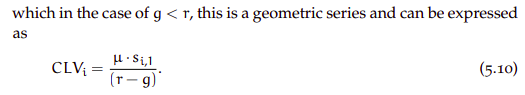

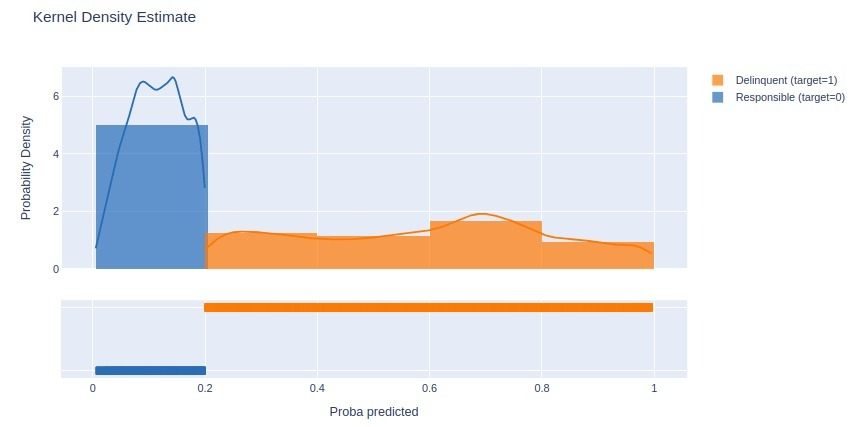

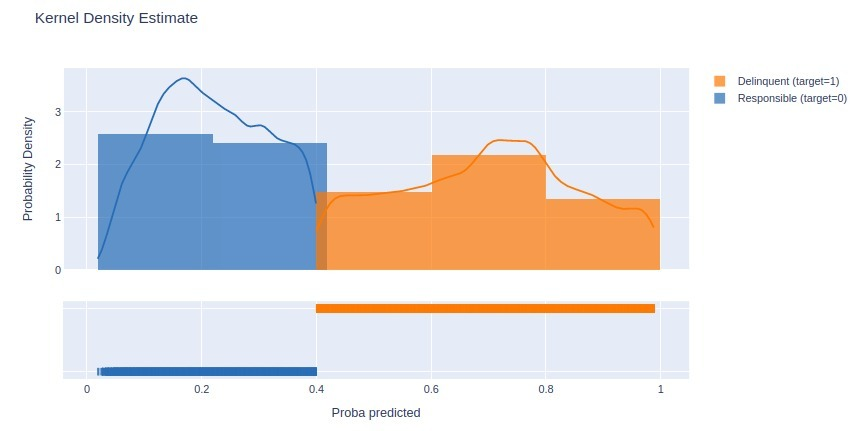

In [ ]:
#eje x score del modelo / costo individual
#eje y puntos observados

In [ ]:
def process_clv(x, rate):
    """
    CLV para los próximos n_years años (podría asumir más tiempo dependiendo el cambio inflacionario).
    Asumo que se pide un préstamo al año (se puede cambiar, por ejemplo teniendo en cuenta la edad). 
    Asumo que cada préstamo posee el mismo valor que el de hoy (tambien se podría cambiar..)
    Asumo que no cuento la pérdida (porque me da resultado negativo)
    Asumo la tasa de interes (1%), igual a la tasa de crédito del préstamo (se podría cambiar..). 
    Asumo también que lo que se paga en total no es el y_pred, sino, la proba de y_pred ("pago esperado/esperanza del pago")
    
    Args:
        - n_years (int): # years
        - x (pd.Series): data to be identified with name column (real, predicted or LoanPrincipal)
        - rate (float): interest rate
        
    Loan * r + proba_pago - Loan * (1 - proba_pago)
        
    Returns for each case his CLV value.
    """
    return ( * x["proba"]) / (rate)
# Si le pongo la ganancia esperada en vez de ingreso (restandole cuando no me paga), obtengo resultados negativos
# porque el modelo me tira muchas probas a que no me paguen

1. calcular cuantas veces va a pedir un prestamo cada uno de los clientes (al año)
2. asumir una tasa de interes (rate)


Lo que gano por cada uno es Loan * r + proba_pago - Loan * (1 - proba_pago)

In [ ]:
def process_clv():
    CLV = total_pagado / cantidad_usuarios / churn

In [82]:
iterators['Proporcion_Inversion'] = iterators['%_inversion'] 
iterators['%_Inversion'] = iterators['%_inversion'] *100

In [224]:
iterators = pd.read_csv("all_data_analisis_inversion.csv")

In [231]:
iterators.drop(iterators[iterators.threshold == 0.5].index, inplace=True)

In [84]:
del iterators['%_inversion']

In [229]:
iterators.sort_values("final_cost").head(20).drop_duplicates().to_csv("kk_final_cost.csv", index=False)

In [230]:
iterators.sort_values("final_cost").drop_duplicates().head(20)

,alpha,threshold,count_zero,count_one,cost,learning_cost,final_cost,Proporcion_Inversion,%_Inversion
164,152,0.35,9849,20151,2622773.06,228368.481028,2.851142e+06,0.080097,8.009721
140,154,0.35,9849,20151,2622773.06,231373.329462,2.854146e+06,0.081066,8.106568
320,155,0.35,9849,20151,2622773.06,232875.753680,2.855649e+06,0.081549,8.154916
332,157,0.35,9849,20151,2622773.06,235880.602114,2.858654e+06,0.082515,8.251458
396,163,0.35,9849,20151,2622773.06,244895.147418,2.867668e+06,0.085399,8.539870
176,164,0.35,9849,20151,2622773.06,246397.571635,2.869171e+06,0.085878,8.587763
316,171,0.35,9849,20151,2622773.06,256914.541156,2.879688e+06,0.089216,8.921612
148,173,0.35,9849,20151,2622773.06,259919.389591,2.882692e+06,0.090165,9.016549
300,180,0.35,9849,20151,2622773.06,270436.359112,2.893209e+06,0.093473,9.347279
256,187,0.35,9849,20151,2622773.06,280953.328633,2.903726e+06,0.096756,9.675613


In [225]:
iterators[iterators['%_Inversion'] <= 12].sort_values("%_Inversion", ascending=False).drop_duplicates().head(20)

,alpha,threshold,count_zero,count_one,cost,learning_cost,final_cost,Proporcion_Inversion,%_Inversion
285,210,0.40,11207,18793,2825111.32,382268.631726,3.207380e+06,0.119184,11.918408
211,173,0.50,13928,16072,3185390.62,430996.268801,3.616387e+06,0.119179,11.917869
304,234,0.35,9849,20151,2622773.06,351567.266845,2.974340e+06,0.118200,11.820008
302,180,0.45,12602,17398,2908261.74,388959.460304,3.297221e+06,0.117966,11.796584
319,171,0.50,13928,16072,3185390.62,426013.652977,3.611404e+06,0.117963,11.796343
212,233,0.35,9849,20151,2622773.06,350064.842628,2.972838e+06,0.117754,11.775443
293,207,0.40,11207,18793,2825111.32,376807.651272,3.201919e+06,0.117682,11.768182
197,206,0.40,11207,18793,2825111.32,374987.324455,3.200099e+06,0.117180,11.717993
380,231,0.35,9849,20151,2622773.06,347059.994193,2.969833e+06,0.116862,11.686179
252,230,0.35,9849,20151,2622773.06,345557.569976,2.968331e+06,0.116415,11.641478


In [233]:
iterators[iterators['%_Inversion'] <= 12].sort_values("%_Inversion", ascending=False).drop_duplicates().head(20).to_csv("kk_%_Inversion.csv", index=False)

In [258]:
iterators[iterators['%_Inversion'] <= 12].sort_values("count_zero", ascending=False).head(20)

,alpha,threshold,count_zero,count_one,cost,learning_cost,final_cost,Proporcion_Inversion,%_Inversion
398,163,0.45,12602,17398,2.90826e+06,352224,3.26049e+06,0.108028,10.8028
150,173,0.45,12602,17398,2.90826e+06,373833,3.28209e+06,0.113901,11.3901
334,157,0.45,12602,17398,2.90826e+06,339259,3.24752e+06,0.104467,10.4467
142,154,0.45,12602,17398,2.90826e+06,332776,3.24104e+06,0.102676,10.2676
302,180,0.45,12602,17398,2.90826e+06,388959,3.29722e+06,0.117966,11.7966
166,152,0.45,12602,17398,2.90826e+06,328455,3.23672e+06,0.101478,10.1478
322,155,0.45,12602,17398,2.90826e+06,334937,3.2432e+06,0.103274,10.3274
210,173,0.45,12602,17398,2.90826e+06,373833,3.28209e+06,0.113901,11.3901
178,164,0.45,12602,17398,2.90826e+06,354385,3.26265e+06,0.108619,10.8619
26,152,0.45,12602,17398,2.90826e+06,328455,3.23672e+06,0.101478,10.1478


In [234]:
iterators[iterators['%_Inversion'] <= 12].sort_values("count_zero", ascending=False).drop_duplicates().head(20).to_csv("kk_count_zero.csv", index=False)

In [95]:
iterators[iterators['%_Inversion'] <= 12].sort_values(['count_zero', "final_cost"], ascending=[False,True]).head(1)

,alpha,threshold,count_zero,count_one,cost,learning_cost,final_cost,Proporcion_Inversion,%_Inversion
27,152,0.5,13928,16072,3.18539e+06,378679,3.56407e+06,0.106249,10.6249


In [235]:
iterators[iterators['%_Inversion'] <= 12].sort_values("learning_cost", ascending=True).drop_duplicates().head(20).to_csv("kk_learning_cost.csv", index=False)

In [260]:
iterators[iterators['%_Inversion'] <= 12].sort_values("learning_cost", ascending=True).head(20)

,alpha,threshold,count_zero,count_one,cost,learning_cost,final_cost,Proporcion_Inversion,%_Inversion
24,152,0.35,9849,20151,2.62277e+06,228368,2.85114e+06,0.0800972,8.00972
164,152,0.35,9849,20151,2.62277e+06,228368,2.85114e+06,0.0800972,8.00972
140,154,0.35,9849,20151,2.62277e+06,231373,2.85415e+06,0.0810657,8.10657
320,155,0.35,9849,20151,2.62277e+06,232876,2.85565e+06,0.0815492,8.15492
332,157,0.35,9849,20151,2.62277e+06,235881,2.85865e+06,0.0825146,8.25146
396,163,0.35,9849,20151,2.62277e+06,244895,2.86767e+06,0.0853987,8.53987
176,164,0.35,9849,20151,2.62277e+06,246398,2.86917e+06,0.0858776,8.58776
316,171,0.35,9849,20151,2.62277e+06,256915,2.87969e+06,0.0892161,8.92161
208,173,0.35,9849,20151,2.62277e+06,259919,2.88269e+06,0.0901655,9.01655
148,173,0.35,9849,20151,2.62277e+06,259919,2.88269e+06,0.0901655,9.01655


In [262]:
iterators.head(20).to_csv("kk_muestra.csv", index=False)

In [263]:
iterators.head(20)

,alpha,threshold,count_zero,count_one,cost,learning_cost,final_cost,Proporcion_Inversion,%_Inversion
0,261,0.35,9849,20151,2.62277e+06,392133,3.01491e+06,0.130065,13.0065
1,261,0.4,11207,18793,2.82511e+06,475105,3.30022e+06,0.143962,14.3962
2,261,0.45,12602,17398,2.90826e+06,563991,3.47225e+06,0.162428,16.2428
4,334,0.35,9849,20151,2.62277e+06,501810,3.12458e+06,0.160601,16.0601
5,334,0.4,11207,18793,2.82511e+06,607989,3.4331e+06,0.177096,17.7096
6,334,0.45,12602,17398,2.90826e+06,721736,3.63e+06,0.198825,19.8825
8,280,0.35,9849,20151,2.62277e+06,420679,3.04345e+06,0.138224,13.8224
9,280,0.4,11207,18793,2.82511e+06,509692,3.3348e+06,0.15284,15.284
10,280,0.45,12602,17398,2.90826e+06,605048,3.51331e+06,0.172216,17.2216
12,294,0.35,9849,20151,2.62277e+06,441713,3.06449e+06,0.144139,14.4139
